# Prediction New York City Taxi Trip Duration

Задача состоит в пострении модели для предсказания длительности поездки в такси Нью-Йорка.

Мы будем работать с данными из соревнования [New York City Taxi Trip Duration](https://www.kaggle.com/c/nyc-taxi-trip-duration/overview), в них представлены время взятия, геокоординаты, коливество пассажиров и некоторые другие переменные.

In [1]:
import datetime 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

sns.set(style="darkgrid")

## 1. Exploratory Data Analysis

### 1.0. Подготовка 

Скачаем обучающую выборку из этого соревнования и загрузим её (можно и непосредственно на Kaggle подключить данные из самого соревнования:

In [2]:
#!wget  -O 'train.csv' -q 'https://www.dropbox.com/s/l5pabq6kfvwoylq/train.csv?dl=0'

In [3]:
train_data = pd.read_csv('train.csv')

Заметим, что колонка `dropoff_datetime` была добавлена организаторами только в обучающую выборку, то есть использовать эту колонку нельзя, давайте удалим ее. В `pickup_datetime` записаны дата и время начала поездки. Чтобы с ней было удобно работать, давайте преобразуем даты в `datetime`-объекты.

In [4]:
train_data = train_data.drop(columns = ["dropoff_datetime"])
train_data["pickup_datetime"] = pd.to_datetime(train_data["pickup_datetime"])
train_data

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,435
...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,2,2016-04-08 13:31:04,4,-73.982201,40.745522,-73.994911,40.740170,N,778
1458640,id1049543,1,2016-01-10 07:35:15,1,-74.000946,40.747379,-73.970184,40.796547,N,655
1458641,id2304944,2,2016-04-22 06:57:41,1,-73.959129,40.768799,-74.004433,40.707371,N,764
1458642,id2714485,1,2016-01-05 15:56:26,1,-73.982079,40.749062,-73.974632,40.757107,N,373


В колонке `trip_duration` записано целевое значение, которое мы хотим предсказывать. Давайте посмотрим на распределение таргета в обучающей выборке. Нарисуем его гистограмму:

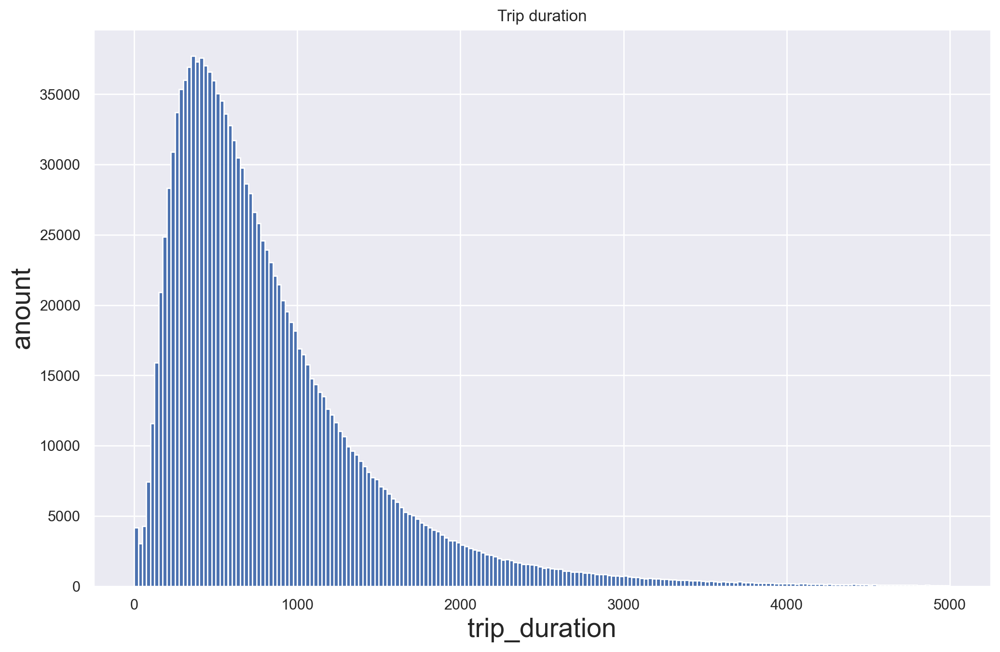

In [5]:
%config InlineBackend.figure_format = 'retina'
plt.rcParams['figure.figsize'] = 12, 7.5
plt.rcParams['font.size'] = 20
from importlib import reload
plt=reload(plt)

plt.title("Trip duration")
plt.xlabel("trip_duration")
plt.ylabel("anount")
plt.hist(train_data["trip_duration"], bins = 200, range=(0,5000))
plt.show()

Есть примеры, в которых длительность поездки нетипично большая, что может сыграть злую шутку, если функция потерь будет слишком чувствительной к выбросам.

Чтобы иметь некоторую точку отсчета, давайте посчитаем значение метрики при наилучшем константном предсказании:

In [6]:
y_train = train_data['trip_duration'].values

best_constant = y_train.mean()

from sklearn.metrics import mean_squared_error
print("Train RMSE with best constant = %.4f" % mean_squared_error(y_train, best_constant * np.ones(y_train.shape), squared=False))

Train RMSE with best constant = 5237.4299


### 1.1 Изучаем `pickup_datetime`

Для начала давайте посмотрим, сколько всего было поездок в каждый из дней. Построим график зависимости количества поездок от дня в году.

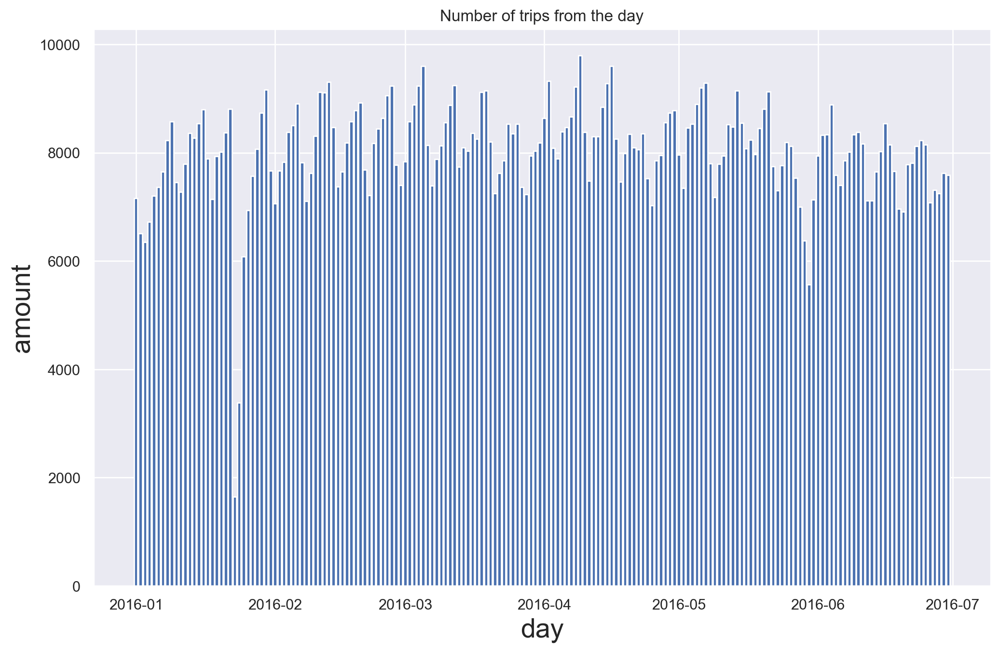

In [7]:
pick = train_data.groupby(pd.Grouper(key = 'pickup_datetime', freq='D')).count()['id'].reset_index()
plt.xlabel("day")
plt.ylabel("amount")
plt.title("Number of trips from the day")
plt.bar(pick['pickup_datetime'].values,pick['id'].values)
plt.show()

In [8]:
print(pick[pick['id']==min(pick['id'].values)]["pickup_datetime"])
print(pick[pick['id']==min(pick[pick.index > 90]['id'].values)]["pickup_datetime"])

22   2016-01-23
Name: pickup_datetime, dtype: datetime64[ns]
150   2016-05-30
Name: pickup_datetime, dtype: datetime64[ns]


Первый "провал" на графике вызван снежной бурей (метель 2016 в США), минимум поездок был 2016-01-23, следующий - 2016-01-24. https://en.wikipedia.org/wiki/January_2016_United_States_blizzard

Второй "провал" - день памяти (день поминовения) 30 мая, 2016-05-30.

Нарисуем графики зависимости количества поездок от дня недели и от часов в сутках:

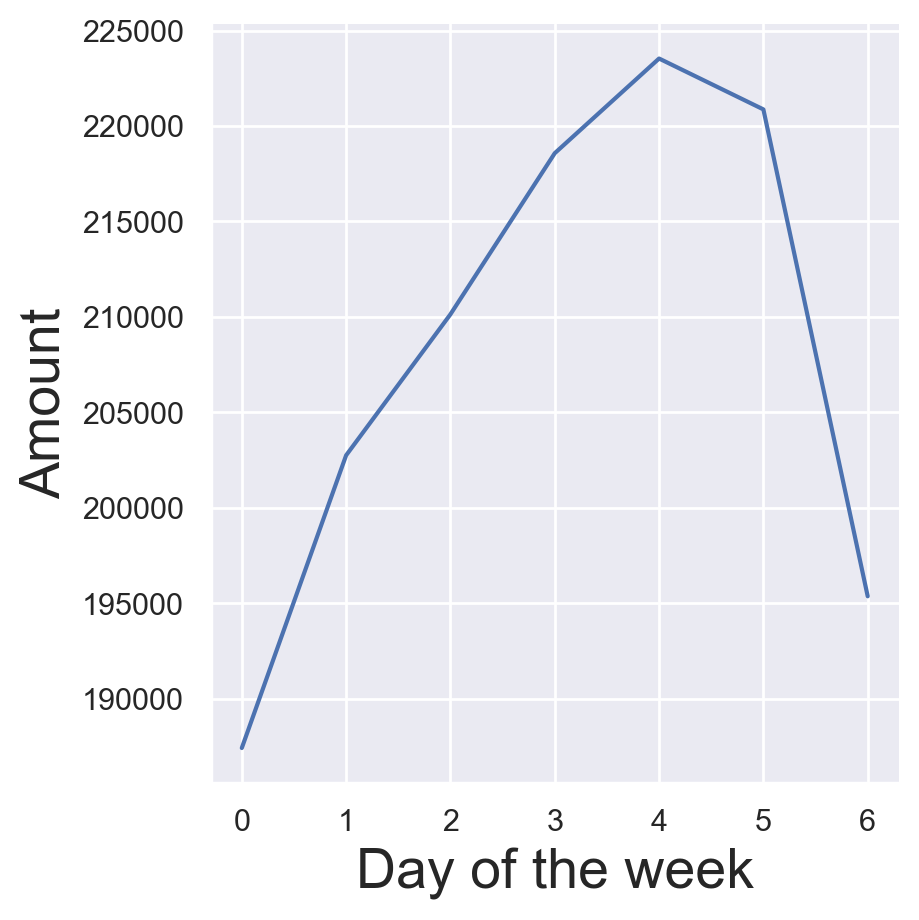

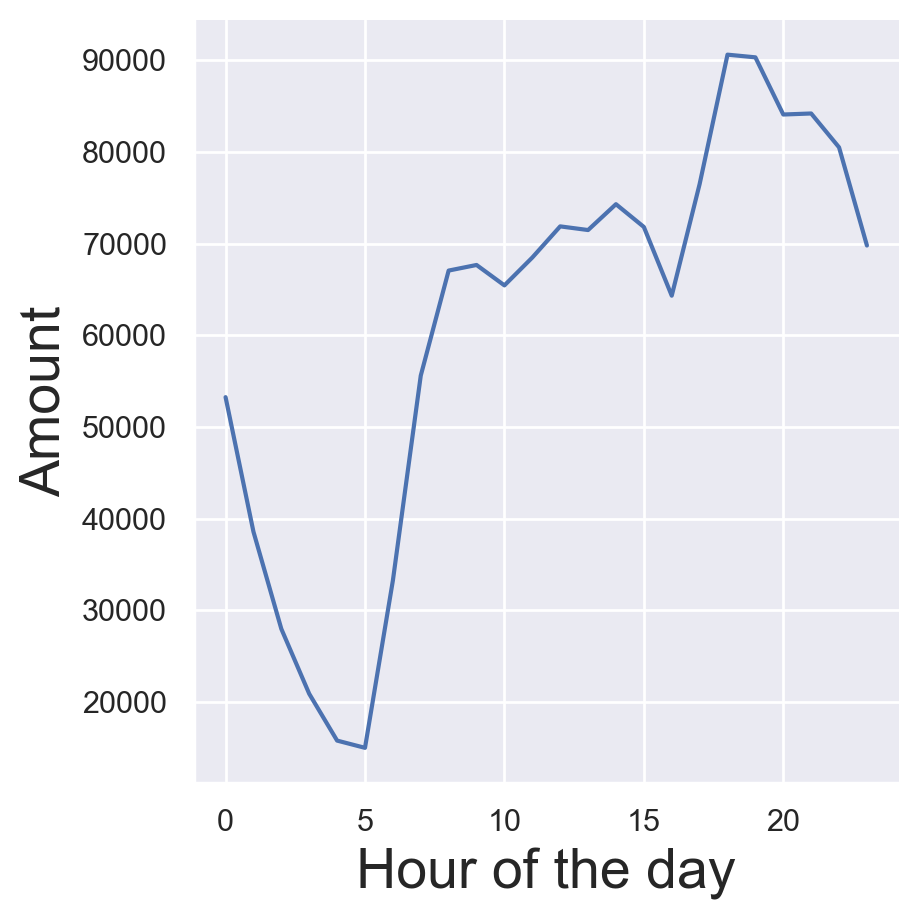

In [9]:
td = train_data.set_index('pickup_datetime')

tdw = td.groupby(td.index.dayofweek).count().reset_index()
g1 = sns.relplot(data = tdw, x = 'pickup_datetime', y='id', kind = 'line')
g1.set_axis_labels('Day of the week', 'Amount')
tdh = td.groupby(td.index.hour).count().reset_index()
g2 = sns.relplot(data = tdh, x = 'pickup_datetime', y='id', kind = 'line')
g2.set_axis_labels('Hour of the day', 'Amount')

Нарисуем на одном графике зависимости количества поездок от часа в сутках для разных месяцев. Аналогично нарисуем зависимости количества поездок от часа в сутках для разных дней недели.

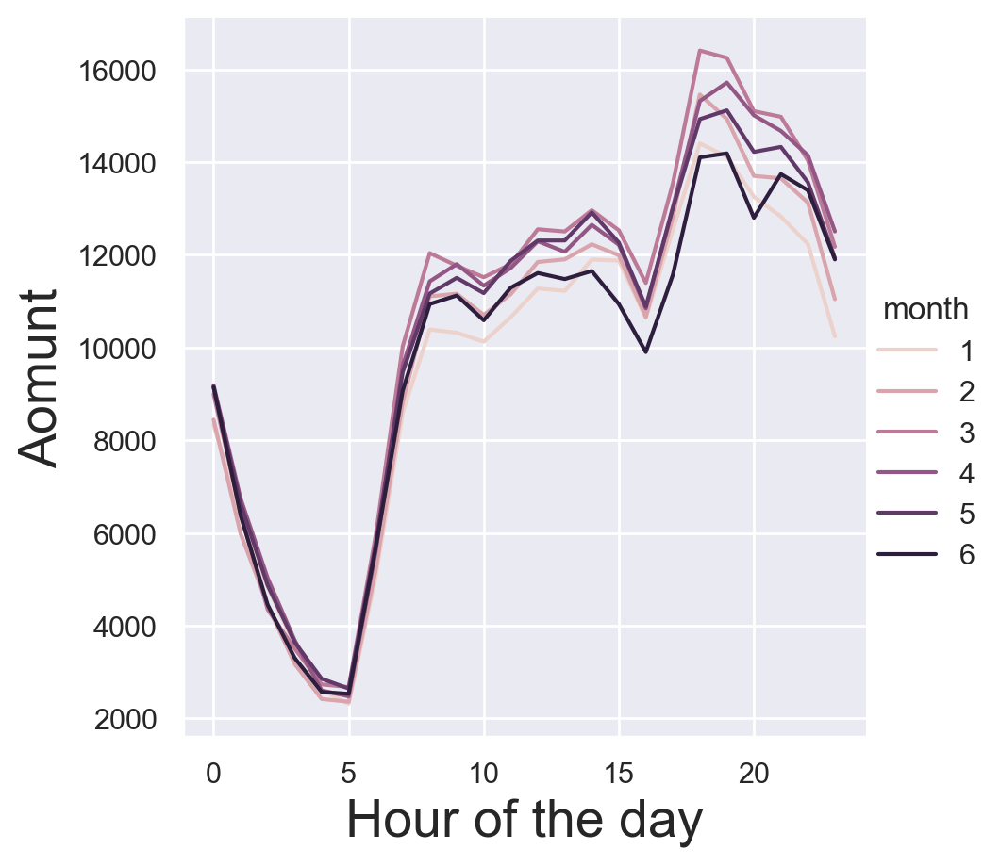

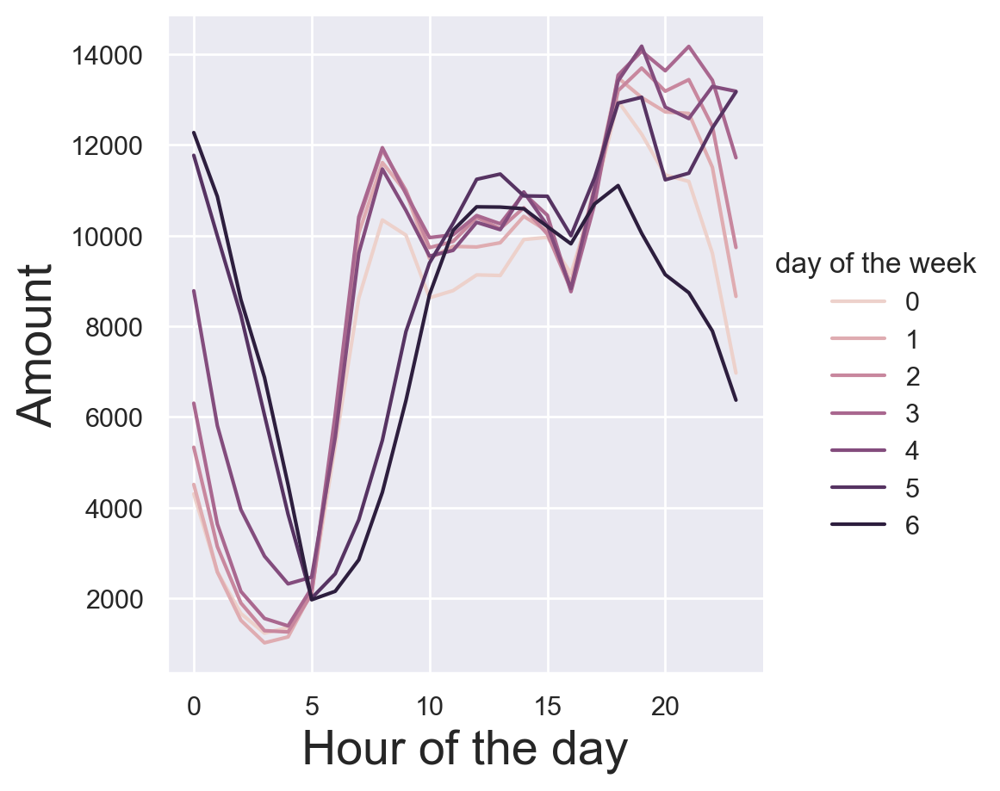

In [10]:
tdhm = td.groupby([td.index.month, td.index.hour]).count()
tdhm.index.names = ['month', 'hour']
tdhm = tdhm.reset_index()
g1 = sns.relplot(data = tdhm, x = 'hour', y='id', hue='month', kind = 'line')
g1.set_axis_labels('Hour of the day', 'Aomunt')

tdhw = td.groupby([td.index.dayofweek, td.index.hour]).count()
tdhw.index.names = ['day of the week', 'hour']
tdhw = tdhw.reset_index()
g2 = sns.relplot(data = tdhw, x = 'hour', y='id', hue='day of the week', kind = 'line')
g2.set_axis_labels('Hour of the day', 'Amount')

Видно, что от месяца практически не зависит увеличение/уменьшение количества заказов.

Также, что вполне логично, к утру количество заказов сильно уменьшается (потому что большинство людей спят, а 5 утра - самый "тихий" период), утром же количество заказов начинает быстро возрастать - людям надо на работу, учёбы или по другим делам (по мере того, как "люди просыпаются", количество заказов растёт), ну и к вечеру, когда большинству люедй надо уезжать с работы, или ехать на какую-нибдуь встречу или вечеринку, количество заказов достигает своего пикового значения.

Больше всего заказов приходится на пятницу, вечер, что также предсказуемо, поскольку пятница - последний рабочий день в неделе.

Разобьём выборку на обучающую и тестовую в отношении 7:3. По обучающей выборке нарисуем график зависимости среднего логарифма времени поездки от дня недели. Затем сделаем то же самое, но для часа в сутках и дня в году.

C:\Users\dima\AppData\Local\Temp\ipykernel_17204\1897389417.py:34: RuntimeWarning: invalid value encountered in double_scalars
  log_average_trip_duration.append(np.sum(y_train[X_train['day']==i])/X_train[X_train['day']==i].shape[0])


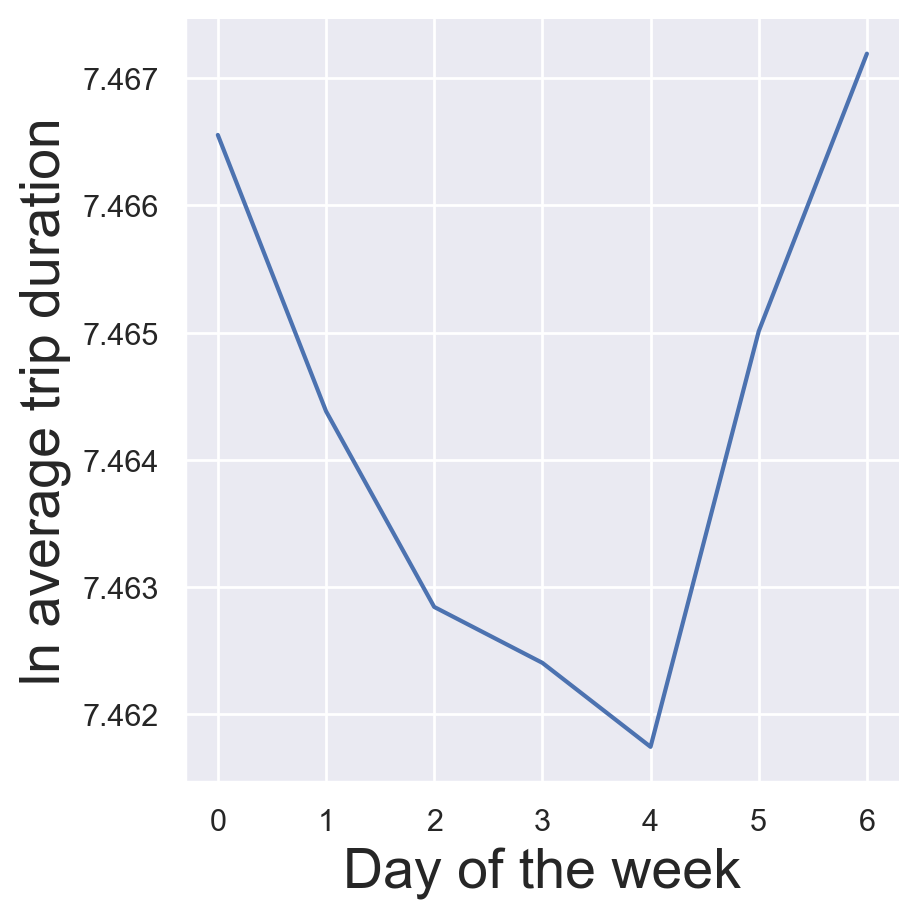

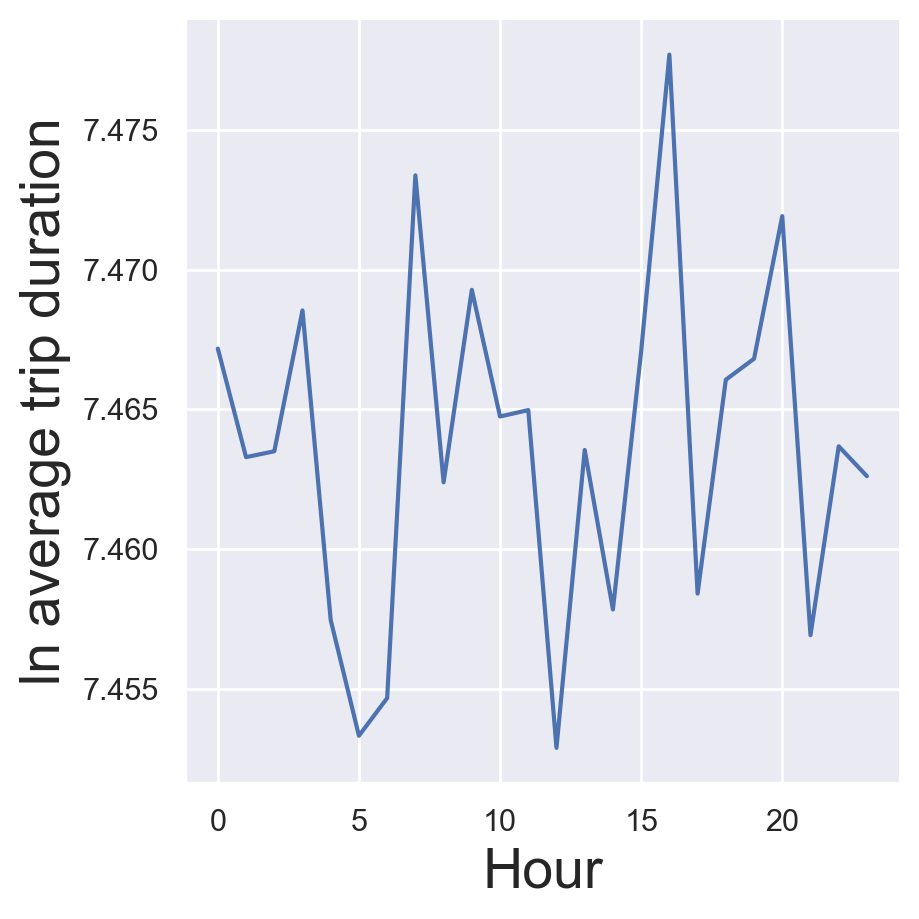

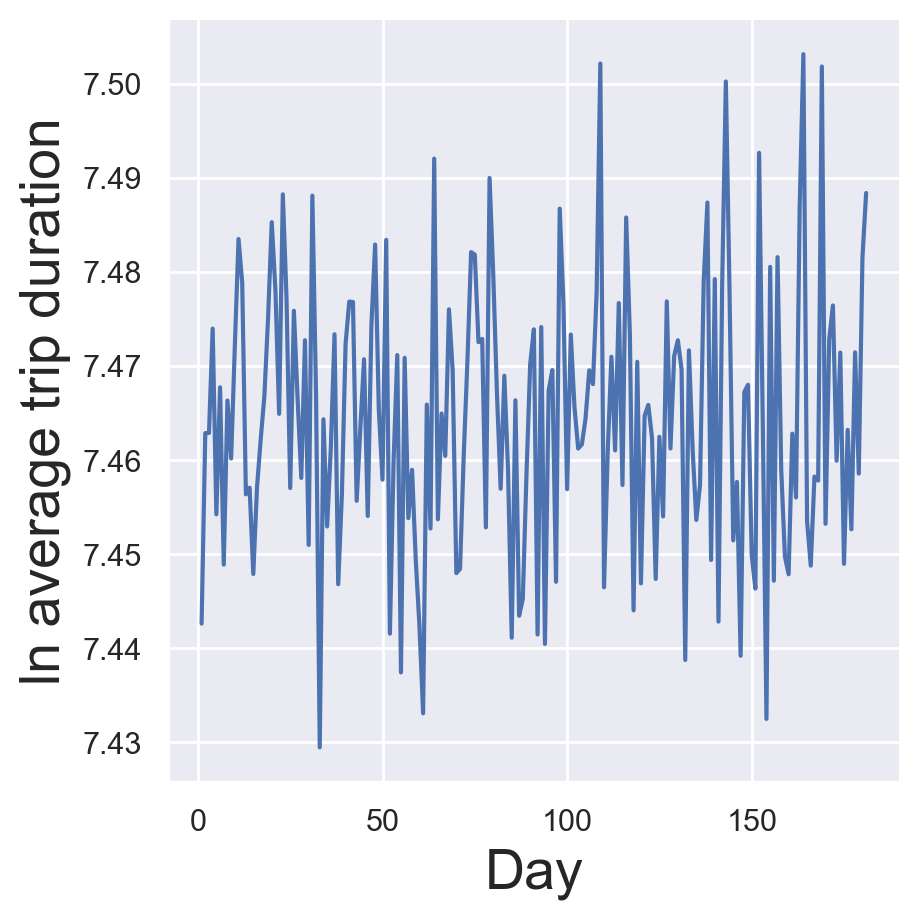

In [11]:
from sklearn.model_selection import train_test_split
import math

train_data['trip_duration'] = np.log(train_data['trip_duration']) + np.ones(train_data.shape[0])

X = train_data.drop(columns = ['trip_duration'])
y = train_data['trip_duration']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)

log_average_trip_duration = []

X_train['day_of_week'] = pd.Series(X_train.set_index('pickup_datetime').index.dayofweek.tolist())

for i in range(7):
  log_average_trip_duration.append(np.sum(y_train[X_train['day_of_week']==i])/X_train[X_train['day_of_week']==i].shape[0])

g1 = sns.relplot(x=range(7), y=log_average_trip_duration, kind='line')
g1.set_axis_labels('Day of the week', 'ln average trip duration')

log_average_trip_duration.clear()

X_train['hour'] = pd.Series(X_train.set_index('pickup_datetime').index.hour.tolist()).astype(int)
for i in range(24):
  log_average_trip_duration.append(np.sum(y_train[X_train['hour']==i])/X_train[X_train['hour']==i].shape[0])

g1 = sns.relplot(x=range(24), y=log_average_trip_duration, kind='line')
g1.set_axis_labels('Hour', 'ln average trip duration')

log_average_trip_duration.clear()

X_train['day'] = pd.Series(X_train.set_index('pickup_datetime').index.day_of_year.tolist()).astype(int)

for i in range(int(max(X_train['day'].values))):
  log_average_trip_duration.append(np.sum(y_train[X_train['day']==i])/X_train[X_train['day']==i].shape[0])

g1 = sns.relplot(x=range(int(max(X_train['day'].values))), y=log_average_trip_duration, kind = 'line')
g1.set_axis_labels('Day', 'ln average trip duration')

Добавим следующие признаки на основе `pickup_datetime`:
1. День недели
2. Месяц
3. Час
4. Является ли период аномальным (два бинарных признака, соответствующие двум аномальным периодам)
5. Номер дня в году

In [12]:
X_train['month'] = pd.Series(X_train.set_index('pickup_datetime').index.month.tolist())
X_train['first_anomaly'] = pd.Series(np.zeros(X_train.shape[0]))
X_train.loc[(X_train['day']==23) | (X_train['day']==24), 'first_anomaly'] = np.ones(X_train[(X_train['day']==23) | (X_train['day']==24)].shape[0])
X_train['second_anomaly'] = pd.Series(np.zeros(X_train.shape[0]))
X_train.loc[X_train['day']==151, 'second_anomaly'] = np.ones(X_train[X_train['day']==151].shape[0])

X_test['day_of_week'] = pd.Series(X_test.set_index('pickup_datetime').index.dayofweek.tolist())
X_test['month'] = pd.Series(X_test.set_index('pickup_datetime').index.month.tolist())
X_test['hour'] = pd.Series(X_test.set_index('pickup_datetime').index.hour.tolist())
X_test['day'] = pd.Series(X_test.set_index('pickup_datetime').index.day_of_year.tolist())
X_test['first_anomaly'] = pd.Series(np.zeros(X_test.shape[0]))
X_test.loc[(X_test['day']==23) | (X_test['day']==24), 'first_anomaly'] = np.ones(X_test[(X_test['day']==23) | (X_test['day']==24)].shape[0])
X_test['second_anomaly'] = pd.Series(np.zeros(X_test.shape[0]))
X_test.loc[X_test['day']==151, 'second_anomaly'] = np.ones(X_test[X_test['day']==151].shape[0])

X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

train_data['month'] = pd.Series(train_data.set_index('pickup_datetime').index.month.tolist())
train_data['hour'] = pd.Series(train_data.set_index('pickup_datetime').index.hour.tolist())
train_data['day'] = pd.Series(train_data.set_index('pickup_datetime').index.day_of_year.tolist())
train_data['day_of_week'] = pd.Series(train_data.set_index('pickup_datetime').index.dayofweek.tolist())
train_data['first_anomaly'] = pd.Series(np.zeros(train_data.shape[0]))
train_data.loc[(train_data['day']==23) | (train_data['day']==24), 'first_anomaly'] = np.ones(train_data[(train_data['day']==23) | (train_data['day']==24)].shape[0])
train_data['second_anomaly'] = pd.Series(np.zeros(train_data.shape[0]))
train_data.loc[train_data['day']==151, 'second_anomaly'] = np.ones(train_data[train_data['day']==151].shape[0])

Обучим Ridge-регрессию с параметрами по умолчанию, закодировав все категориальные признаки с помощью OneHotEncoder. Численные признаки отмасштабируем с помощью StandardScaler.

In [13]:
categorical = ['day_of_week']
numeric_features = ['month', 'day', 'hour', 'first_anomaly', 'second_anomaly']

from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler


column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)

print("Test RMSE = %.4f" % mean_squared_error(y_test, y_pred, squared=False))


Test RMSE = 0.7981


### 1.2. Изучаем координаты

Мы уже очень хорошо изучили данные о времени начала поездки, давайте теперь посмотрим на информацию о координатах начала и конца поездки. Функция ниже на карте рисует точки начала или конца поездки.

In [14]:
#!pip install folium
import folium

# чтобы карта отображалась, рекомендуется включить VPN

In [15]:
def show_circles_on_map(data, latitude_column, longitude_column, color):
    """
    The function draws map with circles on it.
    The center of the map is the mean of coordinates passed in data.
    
    data: DataFrame that contains columns latitude_column and longitude_column
    latitude_column: string, the name of column for latitude coordinates
    longitude_column: string, the name of column for longitude coordinates
    color: string, the color of circles to be drawn
    """
    
    location = (data[latitude_column].mean(), data[longitude_column].mean())
    m = folium.Map(location=location)

    for _, row in data.iterrows():
        folium.Circle(
            radius=100,
            location=(row[latitude_column], row[longitude_column]),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    return m

In [16]:
show_circles_on_map(train_data.sample(10000), "pickup_latitude", "pickup_longitude", "blue")

In [17]:
show_circles_on_map(train_data.sample(10000), "dropoff_latitude", "dropoff_longitude", "blue")

Заметим, что некоторые точки выделяются.В основном это точки из (или в) аэропорты (иногда это просто случайные вызовы из далека).

Как мы все прекрасно помним, $t = s / v_{\text{ср}}$, поэтому очевидно, что самым сильным признаком будет расстояние, которое необходимо проехать. Мы не можем посчитать точное расстояние, которое необходимо преодолеть такси, но мы можем его оценить, посчитав кратчайшее расстояние между точками начала и конца поездки. Чтобы корректно посчитать расстояние между двумя точками на Земле, можно использовать функцию `haversine`.

In [18]:
#!pip install haversine
from haversine import haversine

In [19]:
train_data['haversine'] = train_data.apply(lambda x: haversine((x.pickup_latitude, x.pickup_longitude),(x.dropoff_latitude, x.dropoff_longitude)), axis = 1) 
train_data

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,month,hour,day,day_of_week,first_anomaly,second_anomaly,haversine
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,7.120297,3,17,74,0,0.0,0.0,1.498523
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,7.496775,6,0,164,6,0.0,0.0,1.805510
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,8.661056,1,11,19,1,0.0,0.0,6.385107
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,7.061457,4,19,97,2,0.0,0.0,1.485500
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,7.075346,3,13,86,5,0.0,0.0,1.188590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,2,2016-04-08 13:31:04,4,-73.982201,40.745522,-73.994911,40.740170,N,7.656727,4,13,99,4,0.0,0.0,1.225082
1458640,id1049543,1,2016-01-10 07:35:15,1,-74.000946,40.747379,-73.970184,40.796547,N,7.484635,1,7,10,6,0.0,0.0,6.049844
1458641,id2304944,2,2016-04-22 06:57:41,1,-73.959129,40.768799,-74.004433,40.707371,N,7.638568,4,6,113,4,0.0,0.0,7.824617
1458642,id2714485,1,2016-01-05 15:56:26,1,-73.982079,40.749062,-73.974632,40.757107,N,6.921578,1,15,5,1,0.0,0.0,1.092565


Так как мы предсказываем логарифм времени поездки и хотим, чтобы наши признаки были линейно зависимы с этой целевой переменной, нам нужно логарифмировать расстояние: $\log t=\log s-\log v_{ср}$. Запишем логарифм haversine в отдельную колонку:

In [20]:
train_data['log_haversine'] = train_data.apply(lambda x: np.log(x.haversine) + 1 if(x.haversine != 0) else 0, axis = 1)
train_data

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,month,hour,day,day_of_week,first_anomaly,second_anomaly,haversine,log_haversine
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,7.120297,3,17,74,0,0.0,0.0,1.498523,1.404480
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,7.496775,6,0,164,6,0.0,0.0,1.805510,1.590843
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,8.661056,1,11,19,1,0.0,0.0,6.385107,2.853968
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,7.061457,4,19,97,2,0.0,0.0,1.485500,1.395752
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,7.075346,3,13,86,5,0.0,0.0,1.188590,1.172768
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,2,2016-04-08 13:31:04,4,-73.982201,40.745522,-73.994911,40.740170,N,7.656727,4,13,99,4,0.0,0.0,1.225082,1.203008
1458640,id1049543,1,2016-01-10 07:35:15,1,-74.000946,40.747379,-73.970184,40.796547,N,7.484635,1,7,10,6,0.0,0.0,6.049844,2.800032
1458641,id2304944,2,2016-04-22 06:57:41,1,-73.959129,40.768799,-74.004433,40.707371,N,7.638568,4,6,113,4,0.0,0.0,7.824617,3.057275
1458642,id2714485,1,2016-01-05 15:56:26,1,-73.982079,40.749062,-73.974632,40.757107,N,6.921578,1,15,5,1,0.0,0.0,1.092565,1.088529


In [21]:
print(train_data['haversine'].corr(train_data['trip_duration']))
print(train_data['log_haversine'].corr(train_data['trip_duration']))

0.5721275952726476
0.767047479545294


Заметим, что логарифм расстояния гораздо лучше кореллирует с таргетом.

Давайте изучим среднюю скорость движения такси. Посчитаем среднюю скорость для каждого объекта обучающей выборки, разделив `haversine` на `trip_duration`, и нарисуем гистограмму ее распределения.

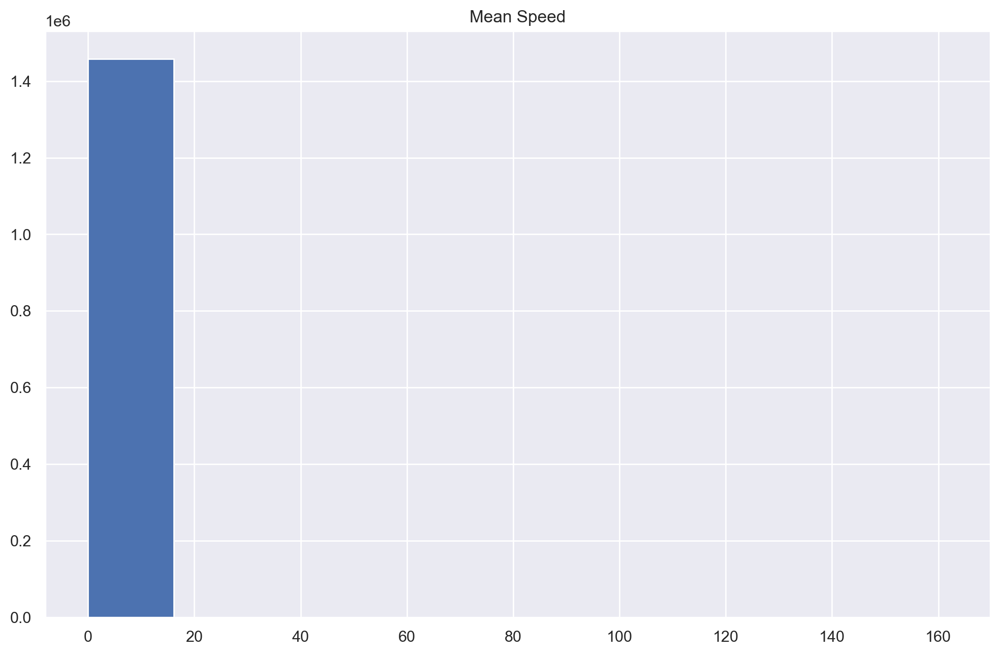

In [22]:
mean_speed = train_data['haversine'] / train_data['trip_duration']
plt.title("Mean Speed")

plt.hist(mean_speed.values)
plt.show()


Как можно видеть по гистограмме, для некоторых объектов у нас получились очень больше значения скоростей. Нарисуем гистограмму по объектам, для которых значение скорости получилось разумным:

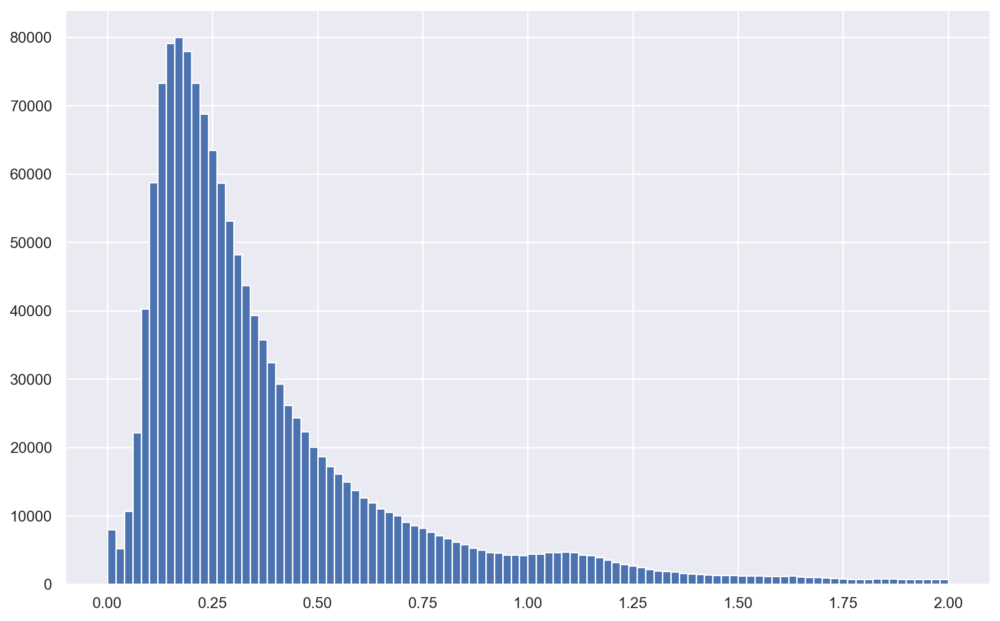

In [23]:
plt.hist(mean_speed.values, bins = 100, range = (0.000001,2))
plt.show()

Для каждой пары (день недели, час суток) посчитаем медиану скоростей. Нарисуем с помощью `sns.heatmap` график, где по осям будут дни недели и часы, а в качестве значения функции - медиана скорости.

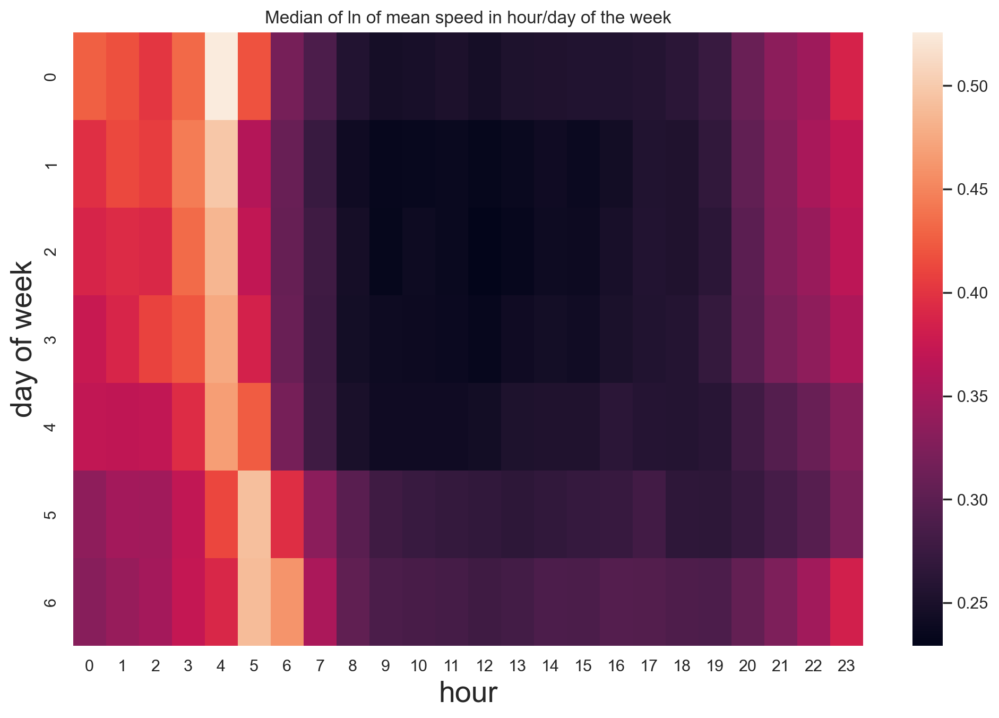

In [24]:
train_data['mean_speed'] = pd.Series(mean_speed)

from statistics import median

dwhm = [ [0]*24 for i in range(7)]
for dw in range(7):
    for h in range(24):
        dwhm[dw][h] = median(train_data[(train_data['day_of_week']==dw)&(train_data['hour']==h)]['mean_speed'])

g1 = sns.heatmap(dwhm).set(xlabel='hour', ylabel='day of week', title='Median of ln of mean speed in hour/day of the week')

Значение скорости лучше не использовать, потому что оно линейно зависит от уже имеющихся признаков (а именно от длины пути).

In [25]:
train_data = train_data.drop(columns = ['mean_speed'])

Исходя из тепловой карты создадим признаки "поездка совершается в период пробок" и "поездка совершается в период свободных дорог".

In [26]:
train_data['is_in_traffic_jam'] = np.zeros(train_data.shape[0])
train_data.loc[((train_data['day_of_week']>=0) & (train_data['day_of_week']<=4) & (train_data['hour']>=8) & 
          (train_data['hour'] <=18))|((train_data['day_of_week']==5)&(train_data['hour']>=18)&(train_data['hour']<=20)), 'is_in_traffic_jam'] = np.ones(
               train_data[((train_data['day_of_week']>=0) & (train_data['day_of_week']<=4) & (train_data['hour']>=8) & 
               (train_data['hour'] <=18))|((train_data['day_of_week']==5)&(train_data['hour']>=18)&(train_data['hour']<=20))].shape[0]
          )

train_data['is_free_road'] = np.zeros(train_data.shape[0])
train_data.loc[((train_data['hour']==3)&(train_data['day_of_week']>=0)&(train_data['day_of_week']<=3))|
           ((train_data['hour']==4)&(train_data['day_of_week']>=0)&(train_data['day_of_week']<=4))|
           (train_data['hour']==5)|
           ((train_data['hour']==6)&(train_data['day_of_week']>=5)&(train_data['day_of_week']<=6)), 'is_free_road'] = np.ones(
               train_data[((train_data['hour']==3)&(train_data['day_of_week']>=0)&(train_data['day_of_week']<=3))|
               ((train_data['hour']==4)&(train_data['day_of_week']>=0)&(train_data['day_of_week']<=4))|
               (train_data['hour']==5)|
               ((train_data['hour']==6)&(train_data['day_of_week']>=5)&(train_data['day_of_week']<=6))].shape[0]
           )

train_data

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,month,hour,day,day_of_week,first_anomaly,second_anomaly,haversine,log_haversine,is_in_traffic_jam,is_free_road
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,7.120297,3,17,74,0,0.0,0.0,1.498523,1.404480,1.0,0.0
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,7.496775,6,0,164,6,0.0,0.0,1.805510,1.590843,0.0,0.0
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,8.661056,1,11,19,1,0.0,0.0,6.385107,2.853968,1.0,0.0
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,7.061457,4,19,97,2,0.0,0.0,1.485500,1.395752,0.0,0.0
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,7.075346,3,13,86,5,0.0,0.0,1.188590,1.172768,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,2,2016-04-08 13:31:04,4,-73.982201,40.745522,-73.994911,40.740170,N,7.656727,4,13,99,4,0.0,0.0,1.225082,1.203008,1.0,0.0
1458640,id1049543,1,2016-01-10 07:35:15,1,-74.000946,40.747379,-73.970184,40.796547,N,7.484635,1,7,10,6,0.0,0.0,6.049844,2.800032,0.0,0.0
1458641,id2304944,2,2016-04-22 06:57:41,1,-73.959129,40.768799,-74.004433,40.707371,N,7.638568,4,6,113,4,0.0,0.0,7.824617,3.057275,0.0,0.0
1458642,id2714485,1,2016-01-05 15:56:26,1,-73.982079,40.749062,-73.974632,40.757107,N,6.921578,1,15,5,1,0.0,0.0,1.092565,1.088529,1.0,0.0


<img src="https://www.dropbox.com/s/xson9nukz5hba7c/map.png?raw=1" align="right" width="20%" style="margin-left: 20px; margin-bottom: 20px">

Сейчас мы почти что не используем сами значения координат. На это есть несколько причин: по отдельности рассматривать широту и долготу не имеет особого смысла, стоит рассматривать их вместе. Во-вторых, понятно, что зависимость между нашим таргетом и координатами не линейная. Чтобы как-то использовать координаты, можно прибегнуть к следующему трюку: обрамим область с наибольшим количеством поездок прямоугольником (как на рисунке). Разобьем этот прямоугольник на ячейки. Каждой точке сопоставим номер ее ячейки, а тем точкам, что не попали ни в одну из ячеек, сопоставим значение -1.

Напишем трансформер, который сначала разбивает показанную на рисунке область на ячейки, а затем создает два признака: номер ячейки, в которой началась поездка, и номер ячейки, в которой закончилась поездка. Количество строк и столбцов выберите самостоятельно.

Трансформер не должен модифицировать передаваемую ему выборку inplace, а все необходимые статистики (если они вдруг нужны) нужно считать только по обучающей выборке в методе `fit`.

In [27]:
#https://ru.stackoverflow.com/questions/1161594
#!pip install ipyleaflet

from sklearn.base import BaseEstimator, TransformerMixin
from ipyleaflet import Map, Marker, basemaps, basemap_to_tiles, Polygon, CircleMarker, LayerGroup
from scipy.spatial.distance import cdist

In [28]:
COL_NAMES = dict(
    pick_lat="pickup_latitude",
    pick_lon="pickup_longitude",
    drop_lat="dropoff_latitude",
    drop_lon="dropoff_longitude"
)

class MapGridTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, loc, col, row, col_names=COL_NAMES):
        self.location_mh = loc
        self.col = col
        self.row = row
        self.col_names = col_names
        self.pick_lat = col_names["pick_lat"]
        self.pick_lon = col_names["pick_lon"]
        self.drop_lat = col_names["drop_lat"]
        self.drop_lon = col_names["drop_lon"]
        self.lat_min, self.lat_max = loc[:, 0].min(), loc[:, 0].max()
        self.lon_min, self.lon_max = loc[:, 1].min(), loc[:, 1].max()

    def create_box_(self, loc):
        polygon_loc = [
                    [(loc[0] - self.walls[0] / 2), loc[1] - self.walls[1] / 2],
                    [loc[0] + self.walls[0] / 2, loc[1] - self.walls[1] / 2],
                    [loc[0] + self.walls[0] / 2, loc[1] + self.walls[1] / 2],
                    [loc[0] - self.walls[0] / 2, loc[1] + self.walls[1] / 2]
                  ]
        return polygon_loc


    def show_map(self):
        self.walls, self.circles_loc = self._fit()
        _map = Map(center=((self.location_mh[:, 0]).mean(), (self.location_mh[:, 1]).mean()),
                   zoom=11, basemap=basemaps.Esri.NatGeoWorldMap)

        circles = [(CircleMarker(location=(lat, long), fill_color='red',
                                 fill_opacity=1, radius=5, stroke=False)) for lat, long in self.circles_loc]
        polygons = [(Polygon(locations=self.create_box_(loc), fill_opacity=0)) for loc in self.circles_loc]

        circles_layer = LayerGroup(layers=circles)
        polygon_layer = LayerGroup(layers=polygons)

        _map.add_layer(circles_layer)
        _map.add_layer(polygon_layer)

        return _map

    def _fit(self):
        self.walls = [(self.location_mh[:, 0].max() - self.location_mh[:, 0].min()) / self.col, \
              (self.location_mh[:, 1].max() - self.location_mh[:, 1].min()) / self.row]

        self.circles_loc = np.array([(((self.location_mh[:, 0].min() + i * (self.walls[0] / 2))), \
                               (self.location_mh[:, 1].min() + j * (self.walls[1] / 2)) ) \
                            for i in range(1, (self.col) * 2, 2) for j in range(1, (self.row) * 2, 2)])

        return self.walls, self.circles_loc


    def get_sector_idx(self, X):
        _, self.circles_loc = self._fit()
        pickup_idx = cdist(X.loc[:, [self.pick_lat, self.pick_lon]],
                           a.circles_loc).argmin(axis=1)
        dropoff_idx = cdist(X.loc[:, [self.drop_lat, self.drop_lon]],
                            a.circles_loc).argmin(axis=1)
        qry = f"@self.lat_min <= {self.pick_lat} <= @self.lat_max \
               and @self.lon_min <= {self.pick_lon} <= @self.lon_max"
        pickup_valid = X.eval(qry).to_numpy()
        pickup_idx[~pickup_valid] = -1
        qry = f"@self.lat_min <= {self.drop_lat} <= @self.lat_max \
               and @self.lon_min <= {self.drop_lon} <= @self.lon_max"
        dropoff_valid = X.eval(qry).to_numpy()
        dropoff_idx[~dropoff_valid] = -1
        return pickup_idx, dropoff_idx

    def transform(self, X):
        d1, d2 = self.get_sector_idx(X)
        X.insert(loc = X.shape[1], column = 'start_square', value = d1)
        X.insert(loc = X.shape[1], column = 'end_square', value = d2)
        return X




In [29]:
mh = np.array([
              [40.703314, -74.018608],
              [40.703314, -73.934241],
              [40.791438, -73.934241],
              [40.791438, -74.018608]
               ])

a = MapGridTransformer(mh, 5, 4)
train_data = a.transform(train_data)
train_data

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,...,day,day_of_week,first_anomaly,second_anomaly,haversine,log_haversine,is_in_traffic_jam,is_free_road,start_square,end_square
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,7.120297,...,74,0,0.0,0.0,1.498523,1.404480,1.0,0.0,13,14
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,7.496775,...,164,6,0.0,0.0,1.805510,1.590843,0.0,0.0,5,4
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,8.661056,...,19,1,0.0,0.0,6.385107,2.853968,1.0,0.0,13,0
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,7.061457,...,97,2,0.0,0.0,1.485500,1.395752,0.0,0.0,0,0
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,7.075346,...,86,5,0.0,0.0,1.188590,1.172768,0.0,0.0,-1,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,2,2016-04-08 13:31:04,4,-73.982201,40.745522,-73.994911,40.740170,N,7.656727,...,99,4,0.0,0.0,1.225082,1.203008,1.0,0.0,9,9
1458640,id1049543,1,2016-01-10 07:35:15,1,-74.000946,40.747379,-73.970184,40.796547,N,7.484635,...,10,6,0.0,0.0,6.049844,2.800032,0.0,0.0,8,-1
1458641,id2304944,2,2016-04-22 06:57:41,1,-73.959129,40.768799,-74.004433,40.707371,N,7.638568,...,113,4,0.0,0.0,7.824617,3.057275,0.0,0.0,14,0
1458642,id2714485,1,2016-01-05 15:56:26,1,-73.982079,40.749062,-73.974632,40.757107,N,6.921578,...,5,1,0.0,0.0,1.092565,1.088529,1.0,0.0,9,14


Снова обучим `Ridge`-регрессию со стандартными параметрами на признаках, которые мы выделили к текущему моменту.

In [30]:
categorical = ['day_of_week', 'start_square', 'end_square', 'is_in_traffic_jam', 'is_free_road', 'first_anomaly', 'second_anomaly']
numeric_features = ['month', 'day', 'hour', 'log_haversine']

X = train_data.drop(columns = ['trip_duration'])
y = train_data['trip_duration']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)
print("Train RMSE = %.8f" % mean_squared_error(y_train, y_train_pred, squared=False))
print("Test RMSE = %.8f" % mean_squared_error(y_test, y_pred, squared=False))

Train RMSE = 0.47885239
Test RMSE = 0.47719413


Результат стал гораздо лучше.

### 1.3 Изучаем оставшиеся признаки

У нас осталось еще 3 признака, которые мы не исследовали: `vendor_id`, `passenger_count` и `store_and_fwd_flag`.

Посчитаем, сколько есть уникальных значений у каждого из этих признаков:

In [31]:
print("Unique values of 'vendor_id' -", pd.unique(train_data["vendor_id"]).shape[0])
print("Unique values of 'passenger_count' -",  pd.unique(train_data["passenger_count"]).shape[0])
print("Unique values of 'store_and_fwd_flag' -",  pd.unique(train_data["store_and_fwd_flag"]).shape[0])

Unique values of 'vendor_id' - 2
Unique values of 'passenger_count' - 10
Unique values of 'store_and_fwd_flag' - 2


Построем "ящики с усами" распределений логарифма времени поездки в зависимости от значений каждого из признаков.

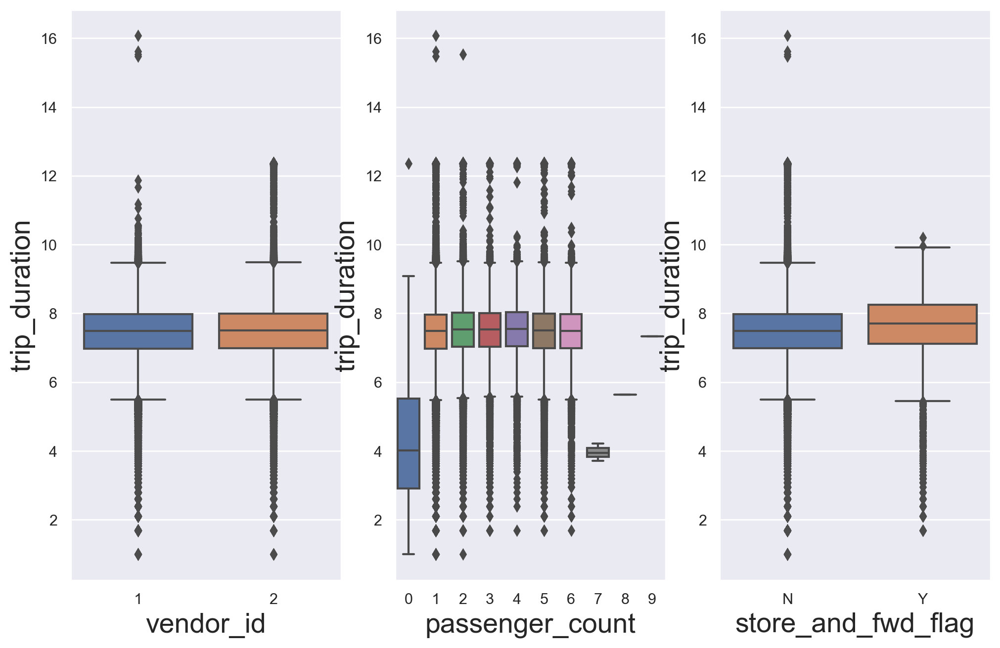

In [32]:
fig, axs = plt.subplots(ncols=3)

b1 = sns.boxplot(data = train_data, x = 'vendor_id', y = 'trip_duration', ax = axs[0])
b2 = sns.boxplot(data = train_data, x = 'passenger_count', y = 'trip_duration', ax = axs[1])
b3 = sns.boxplot(data = train_data, x = 'store_and_fwd_flag', y = 'trip_duration', ax = axs[2])

"Коробки" у `vendor_id` и у `store_and_fwg_flag` почти не отличаются (внтури каждого признака). Что касается `passanger_count`, тоже, потому что коробки от 1 до 6 пассажиров тоже одинаковые, а 7-9 пассажиров - довольно большая редкость. Скорее всего это будут очень слабые признаки, которые стоит удалить.

Переведём признаки `vendor_id` и `store_and_fwd_flag` в значения $\{0;1\}$.

In [33]:
train_data.vendor_id = pd.get_dummies(train_data['vendor_id'])[2]
train_data.store_and_fwd_flag = pd.get_dummies(train_data['store_and_fwd_flag']).Y
train_data

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,...,day,day_of_week,first_anomaly,second_anomaly,haversine,log_haversine,is_in_traffic_jam,is_free_road,start_square,end_square
0,id2875421,1,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,0,7.120297,...,74,0,0.0,0.0,1.498523,1.404480,1.0,0.0,13,14
1,id2377394,0,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,0,7.496775,...,164,6,0.0,0.0,1.805510,1.590843,0.0,0.0,5,4
2,id3858529,1,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,0,8.661056,...,19,1,0.0,0.0,6.385107,2.853968,1.0,0.0,13,0
3,id3504673,1,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,0,7.061457,...,97,2,0.0,0.0,1.485500,1.395752,0.0,0.0,0,0
4,id2181028,1,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,0,7.075346,...,86,5,0.0,0.0,1.188590,1.172768,0.0,0.0,-1,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,1,2016-04-08 13:31:04,4,-73.982201,40.745522,-73.994911,40.740170,0,7.656727,...,99,4,0.0,0.0,1.225082,1.203008,1.0,0.0,9,9
1458640,id1049543,0,2016-01-10 07:35:15,1,-74.000946,40.747379,-73.970184,40.796547,0,7.484635,...,10,6,0.0,0.0,6.049844,2.800032,0.0,0.0,8,-1
1458641,id2304944,1,2016-04-22 06:57:41,1,-73.959129,40.768799,-74.004433,40.707371,0,7.638568,...,113,4,0.0,0.0,7.824617,3.057275,0.0,0.0,14,0
1458642,id2714485,0,2016-01-05 15:56:26,1,-73.982079,40.749062,-73.974632,40.757107,0,6.921578,...,5,1,0.0,0.0,1.092565,1.088529,1.0,0.0,9,14


Проверим свои предположения, обучив модель в том числе и на этих трех признаках. Обучим Ridge-регрессию со стандартными параметрами.

In [34]:
categorical = ['day_of_week', 'start_square', 'end_square', 'is_in_traffic_jam', 'is_free_road', 'first_anomaly', 'second_anomaly', 'vendor_id', 'store_and_fwd_flag']
numeric_features = ['month', 'day', 'hour', 'log_haversine', 'passenger_count']

X = train_data.drop(columns = ['trip_duration'])
y = train_data['trip_duration']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)
print("Train RMSE = %.8f" % mean_squared_error(y_train, y_train_pred, squared=False))
print("Test RMSE = %.8f" % mean_squared_error(y_test, y_pred, squared=False))

Train RMSE = 0.47872314
Test RMSE = 0.47704976


Стало совсем немного лучше (разница с предыдущими результатами порядка 1e-4), но на других данных это могло бы наоборот немного ухудшить ситуацию. 
В общем, ощутимого улучшения нет.

### 1.4 Улучшаем простейшую модель

В наших данных есть нетипичные объекты: с аномально маленьким времени поездки, с очень большим пройденным расстоянием или очень большими остатками регрессии.Стоит исключить такие объекты из обучающей выборки. Для этого нарисуем гистограммы распределения упомянутых выше величин, выберем объекты, которые можно назвать выбросами, и очистим обучающую выборку от них.

Отметим, что хотя эти объекты и выглядят как выбросы, в тестовой выборке тоже скорее всего будут объекты с такими же странными значениями целевой переменной и/или признаков. Поэтому, возможно, чистка обучающей выборки приведёт к ухудшению качества на тесте. Тем не менее, всё равно лучше удалять выбросы из обучения, чтобы модель получалась более разумной и интерпретируемой.

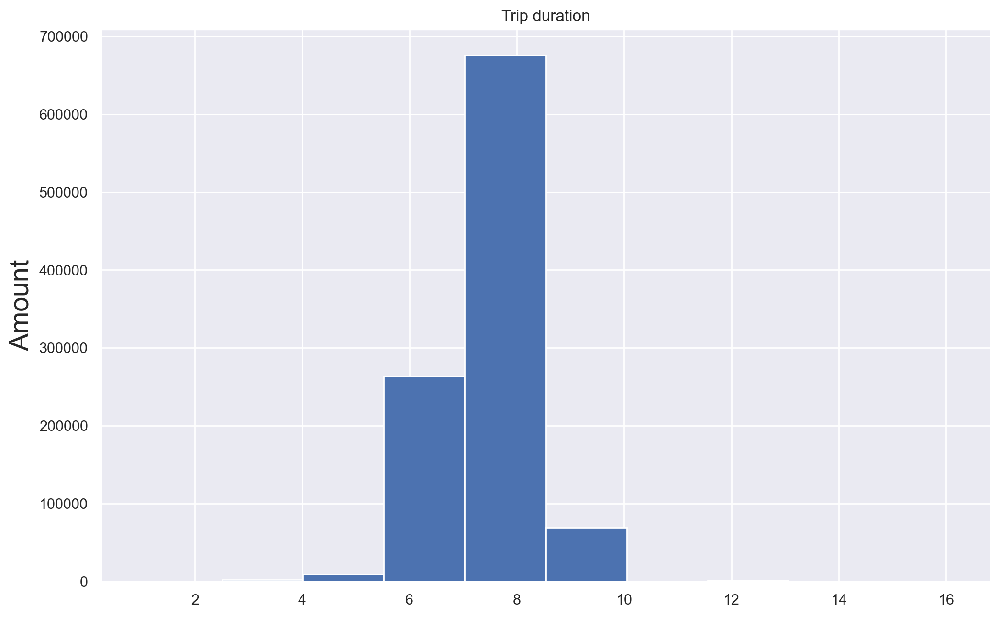

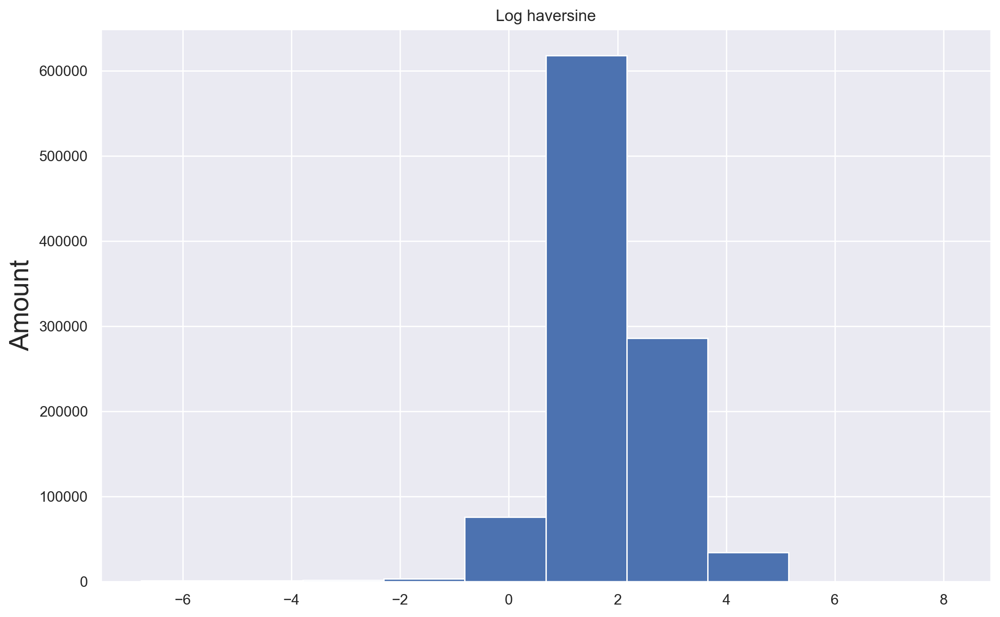

In [35]:
train_data = train_data.drop(columns = ['vendor_id', 'store_and_fwd_flag', 'passenger_count', 'haversine', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude'])

X = train_data.drop(columns = ['trip_duration'])
y = train_data['trip_duration']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)

plt.hist(y_train.values)
plt.title("Trip duration")
plt.ylabel("Amount")
plt.show()
plt.title("Log haversine")
plt.hist(X_train.log_haversine)
plt.ylabel("Amount")
plt.show()

def clear_func(x, y):
    x["trip_duration"] = y
    x = x[(x["trip_duration"] >= 4) & (x["trip_duration"] <= 10) & (x["log_haversine"] >= -1)&(x["log_haversine"] <= 6)]
    y = x["trip_duration"]
    x = x.drop(columns = ["trip_duration"])
    return x, y

Сейчас у нас очень много категориальных признаков. В категориальных признаках могут содержаться редкие категории, обычно это плохо: модель сильно переобучается на таких примерах. Попробуем объединить редкие категории в одну. Естественно, делать это нужно только для действительно редких категорий.

In [36]:
t = train_data.groupby('first_anomaly').count().reset_index()
print("Amount of 'first anomaly' true",t[t['first_anomaly']==1.0]['id'].values[0])
t = train_data.groupby('second_anomaly').count().reset_index()
print("Amount of 'second anomaly' true",t[t['second_anomaly']==1.0]['id'].values[0])
#видно, что количество первой и второй "аномалии" крайне мало по сравнению со всем датасетом.

t = train_data.groupby('day_of_week').count()
print(t['id'].values)
# похожее количество, тут нет редких категорий

t = train_data.groupby('start_square').count()
print(t['id'])
#здесь будем считать редкими категории, количество которых меньше 10000 (т.е. те, что занимают менее 1% датасета)

t = train_data.groupby('end_square').count()
print(t['id'])
#аналогично с start_square

t = train_data.groupby('is_in_traffic_jam').count()
print(t['id'].values)
# редких нет

t = train_data.groupby('is_free_road').count()
print(t['id'])
# можно, думаю, знаести в редки категории 'is_free_road' = true, поскольку таких менее 3%

train_data['is_anomaly'] = np.zeros(train_data.shape[0])
train_data.loc[(train_data['first_anomaly']==1.0) | (train_data['second_anomaly']==1.0) | (train_data['start_square']==2)|(train_data['start_square']==3)
             |(train_data['start_square']==6)|(train_data['start_square']==7)|(train_data['start_square']==11)|(train_data['start_square']==12)
             |(train_data['start_square']==16) 
             | (train_data['end_square']==2)|(train_data['end_square']==3)|(train_data['end_square']==6)|(train_data['end_square']==7)
             |(train_data['end_square']==11)|(train_data['end_square']==16) | (train_data['is_free_road']==1.0), 'is_anomaly'] = np.ones(train_data[(train_data['first_anomaly']==1.0) 
             | (train_data['second_anomaly']==1.0) | (train_data['start_square']==2)|(train_data['start_square']==3)|(train_data['start_square']==6)
             |(train_data['start_square']==7)|(train_data['start_square']==11)|(train_data['start_square']==12)|(train_data['start_square']==16) 
             | (train_data['end_square']==2)|(train_data['end_square']==3)|(train_data['end_square']==6)
             |(train_data['end_square']==7)|(train_data['end_square']==11)|(train_data['end_square']==16) 
             | (train_data['is_free_road']==1.0)].shape[0])


Amount of 'first anomaly' true 5031
Amount of 'second anomaly' true 5570
[187418 202749 210136 218574 223533 220868 195366]
start_square
-1     162165
 0      70217
 1      21965
 2       3944
 3       2406
 4      79406
 5     146316
 6       2481
 7       1061
 8      64221
 9     258304
 10     65820
 11      3339
 12      9184
 13    178095
 14    175804
 15     28141
 16        19
 17     53355
 18     76138
 19     56263
Name: id, dtype: int64
end_square
-1     233349
 0      68476
 1      22044
 2       8142
 3       6471
 4      70001
 5     124322
 6       6680
 7       3646
 8      59034
 9     229181
 10     67518
 11      4748
 12     13164
 13    161234
 14    160977
 15     28954
 16        59
 17     52716
 18     75613
 19     62315
Name: id, dtype: int64
[846666 611978]
is_free_road
0.0    1426447
1.0      32197
Name: id, dtype: int64


Обучим модель на очищенных данных и посчитаем качество на тестовой выборке.

In [37]:
categorical = ['day_of_week','is_in_traffic_jam', 'is_anomaly']
numeric_features = ['month','day', 'hour', 'log_haversine']

X = train_data.drop(columns = ['trip_duration'])
y = train_data['trip_duration']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)
X_train, y_train = clear_func(X_train, y_train)
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)
print("Train RMSE = %.8f" % mean_squared_error(y_train, y_train_pred, squared=False))
print("Test RMSE = %.8f" % mean_squared_error(y_test, y_pred, squared=False))

Train RMSE = 0.41822578
Test RMSE = 0.48964097


Как и ожидалось: ошибка на тесте немного возрасла, но на трейне она уменьшилась.

## 2. Linear Regression

Изучив данные, теперь попробуем применить и улучшить линейные модели.

Удалим слабые признаки (ранее мы выяснили, какие признаки слабые и могут способствовать переобучению).

In [38]:
train_data = train_data.drop(columns = ['id', 'pickup_datetime', 'first_anomaly', 'second_anomaly', 'is_free_road'])
train_data

,trip_duration,month,hour,day,day_of_week,log_haversine,is_in_traffic_jam,start_square,end_square,is_anomaly
0,7.120297,3,17,74,0,1.404480,1.0,13,14,0.0
1,7.496775,6,0,164,6,1.590843,0.0,5,4,0.0
2,8.661056,1,11,19,1,2.853968,1.0,13,0,0.0
3,7.061457,4,19,97,2,1.395752,0.0,0,0,0.0
4,7.075346,3,13,86,5,1.172768,0.0,-1,18,0.0
...,...,...,...,...,...,...,...,...,...,...
1458639,7.656727,4,13,99,4,1.203008,1.0,9,9,0.0
1458640,7.484635,1,7,10,6,2.800032,0.0,8,-1,0.0
1458641,7.638568,4,6,113,4,3.057275,0.0,14,0,0.0
1458642,6.921578,1,15,5,1,1.088529,1.0,9,14,0.0


Для удобства перенесём и допишем некоторые функции для создания пайплайна обучения.

In [39]:
def clear_func(x, y):
    x["trip_duration"] = y
    x = x[(x["trip_duration"] >= 4) & (x["trip_duration"] <= 10) & (x["log_haversine"] >= -1)&(x["log_haversine"] <= 6)]
    y = x["trip_duration"]
    x = x.drop(columns = ["trip_duration"])
    return x, y

def split(data, ts = 0.3):
    X = data.drop(columns = ['trip_duration'])
    y = data['trip_duration']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)
    X_train, y_train = clear_func(X_train, y_train)
    return X_train, X_test, y_train, y_test

def pipe(cat, num, reg = Ridge()):
    col = ColumnTransformer([
        ('ohe', OneHotEncoder(handle_unknown="ignore"), cat),
        ('scaling', StandardScaler(), num)
    ])
    pipeline = Pipeline(steps=[
        ('ohe_and_scaling', col),
        ('regression', reg)
      ])
    return pipeline

Напомним, какие результаты давала Ridge-регрессия на этих данных.

In [40]:
categorical = ['day_of_week','is_in_traffic_jam', 'is_anomaly', 'month']
numeric_features = ['day', 'hour', 'log_haversine']

X_train, X_test, y_train, y_test = split(train_data)
pipeline_ridge = pipe(categorical, numeric_features)

model_ridge = pipeline_ridge.fit(X_train, y_train)
y_pred = model_ridge.predict(X_test)
y_train_pred = model_ridge.predict(X_train)
print("Train RMSE = %.8f" % mean_squared_error(y_train, y_train_pred, squared=False))
print("Test RMSE = %.8f" % mean_squared_error(y_test, y_pred, squared=False))

Train RMSE = 0.41813559
Test RMSE = 0.48958097


### 2.1. Сравниваем линейные модели

Обучм Lasso-регрессию со стандартными параметрами на том же наборе данных.

In [41]:
from sklearn.linear_model import Lasso

pipeline_lasso = pipe(categorical, numeric_features, Lasso())
model_lasso = pipeline_lasso.fit(X_train, y_train)
y_pred = model_lasso.predict(X_test)
y_train_pred = model_lasso.predict(X_train)
print("Train RMSE = %.8f" % mean_squared_error(y_train, y_train_pred, squared=False))
print("Test RMSE = %.8f" % mean_squared_error(y_test, y_pred, squared=False))

Train RMSE = 0.73689157
Test RMSE = 0.79810496


Давайте посмотрим на веса Ridge-регрессии и Lasso-регрессии. Посмотрим, какие веса занулились.

In [42]:
c1 = list(model_ridge[1].coef_)
c2 = list(model_lasso[1].coef_)
print("Amount of zeros in Ridge:",c1.count(0))
print("Amount of zeros in Lasso:",c2.count(0))

Amount of zeros in Ridge: 0
Amount of zeros in Lasso: 20


По валидационной выборке подберём оптимальные значения параметра регуляризациидля Ridge и Lasso.

In [43]:
X_train_, X_valid, y_train_, y_valid = split(pd.concat([X_train, y_train], axis = 1), 0.2)

from sklearn.model_selection import GridSearchCV
X_valid = model_lasso[0].fit_transform(X_valid)

alphas = np.logspace(-3, 3, 12)
searcher = GridSearchCV(Lasso(), [{"alpha": alphas}], scoring="neg_root_mean_squared_error", cv=10)
searcher.fit(X_valid, y_valid)
best_alpha_lasso = searcher.best_params_["alpha"]
print("Best alpha for Lasso = %.4f" % best_alpha_lasso)

pipeline_lasso[1].alpha = best_alpha_lasso
model_lasso = pipeline_lasso.fit(X_train_, y_train_)
y_pred = model_lasso.predict(X_test)
print("Test RMSE = %.8f" % mean_squared_error(y_test, y_pred, squared=False))

searcher = GridSearchCV(Ridge(), [{"alpha": alphas}], scoring="neg_root_mean_squared_error", cv=10)
searcher.fit(X_valid, y_valid)
best_alpha_ridge = searcher.best_params_["alpha"]
print("Best alpha for Ridge = %.4f" % best_alpha_ridge)

pipeline_ridge[1].alpha = best_alpha_ridge
model_ridge = pipeline_ridge.fit(X_train_, y_train_)
y_pred = model_ridge.predict(X_test)
print("Test RMSE = %.8f" % mean_squared_error(y_test, y_pred, squared=False))

Best alpha for Lasso = 0.0010
Test RMSE = 0.48955466
Best alpha for Ridge = 81.1131
Test RMSE = 0.48958025


Lasso значительно улучшился, и теперь даёт почти такой же результат как Ridge (даже немного лучше). 
Ridge улучшился незначительно.

Для каждого перебранного `alpha` для Lasso посчитаем количество нулевых весов в модели и нарисуем график зависимости его от `alpha`. Посмотрим, как сильно придётся потерять в качестве, если мы хотим с помощью Lasso избавиться хотя бы от половины признаков.

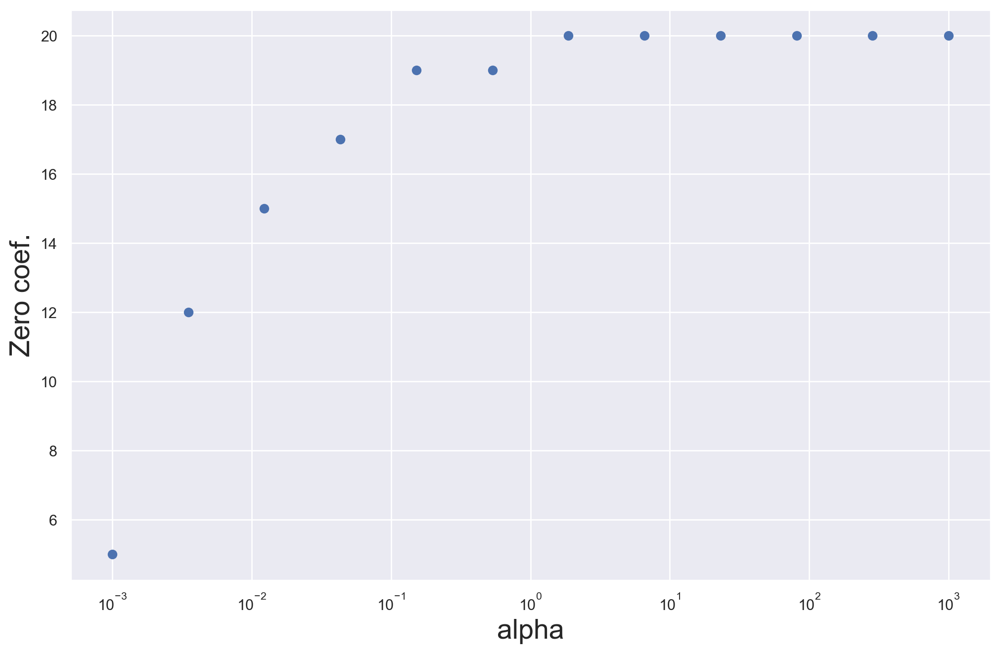

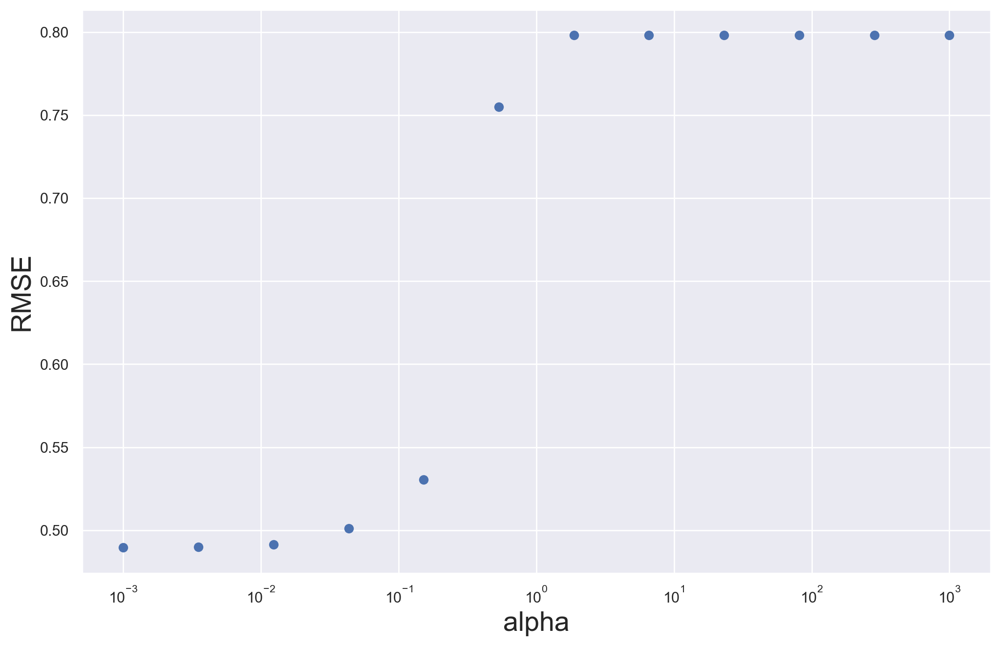

In [44]:
zeros = []
rmse = []
for al in alphas:
    pipeline_lasso[1].alpha = al
    model_lasso = pipeline_lasso.fit(X_train_, y_train_)
    y_pred = model_lasso.predict(X_test)
    rmse.append(mean_squared_error(y_test, y_pred, squared=False))
    zeros.append(list(model_lasso[1].coef_).count(0))

plt.scatter(alphas, zeros)
plt.xscale("log")
plt.xlabel("alpha")
plt.ylabel("Zero coef.")
plt.show()
plt.scatter(alphas, rmse)
plt.xscale("log")
plt.xlabel("alpha")
plt.ylabel("RMSE")
plt.show()

Всего признаков 20, хотя бы от половины - это >=10

По графику видно (первые две точки), что потеряем мы крайне незначительно, а занулим больше половины коэффициэнтов (12)

### 2.2. Новый признак

<img src="https://www.dropbox.com/s/wp4jj0599np17lh/map_direction.png?raw=1" width="20%" align="right" style="margin-left: 20px">

Часто бывает полезным использовать взаимодействия признаков (feature interactions), то есть строить новые признаки на основе уже существующих. Переиспользуем признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка". 

Попробуем сделать следующее: посчитаем, сколько раз встречается каждая возможная пара этих признаков в нашем датасете и выберем 100 самых частых пар. Закодируем поездки с этими частыми парами как категориальный признак, остальным объектам припишем -1. Получается, что мы закодировали, откуда и куда должно было ехать такси.

In [47]:
pairs = list(zip(train_data['start_square'].values.tolist(), train_data['end_square'].values.tolist()))
p = {}
for x in pairs:
    if x in p:
        p[x] += 1
    else:
        p[x] = 1

from collections import OrderedDict

srtd = OrderedDict(sorted(p.items(), key=lambda v: v[1], reverse=True))

first_hundred = list(srtd)[:100]

train_data['squares'] = np.full(train_data.shape[0], -1)

for i in range(100):
    train_data.loc[(train_data['start_square']==first_hundred[i][0]) & (train_data['end_square']==first_hundred[i][1]), 'squares'] = np.full(
      train_data[(train_data['start_square']==first_hundred[i][0]) & (train_data['end_square']==first_hundred[i][1])].shape[0], i)

In [51]:
train_data

,trip_duration,month,hour,day,day_of_week,log_haversine,is_in_traffic_jam,start_square,end_square,is_anomaly,squares
0,7.120297,3,17,74,0,1.404480,1.0,13,14,0.0,13
1,7.496775,6,0,164,6,1.590843,0.0,5,4,0.0,27
2,8.661056,1,11,19,1,2.853968,1.0,13,0,0.0,86
3,7.061457,4,19,97,2,1.395752,0.0,0,0,0.0,31
4,7.075346,3,13,86,5,1.172768,0.0,-1,18,0.0,62
...,...,...,...,...,...,...,...,...,...,...,...
1458639,7.656727,4,13,99,4,1.203008,1.0,9,9,0.0,1
1458640,7.484635,1,7,10,6,2.800032,0.0,8,-1,0.0,81
1458641,7.638568,4,6,113,4,3.057275,0.0,14,0,0.0,-1
1458642,6.921578,1,15,5,1,1.088529,1.0,9,14,0.0,9


Этот признак может быть полезным, поскольку наша модель линейная и не может вытащить этот признак (мы проводим нелинейное преобразование на самом деле, и, более того, мы берём лишь "самые популярные" - первые 100). Полезный он потому, что есть некоторые маршруты, которые пользуются спросом, а значит это в некотором смысле "отдельный класс" (собственно наш признак это и обозначает). В "сыром виде" признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка" будут способствовать переобучению, потому что не все такие классы нас интересуют (многи весьма редкие, а редкие классы - это плохо), поэтмоу мы берём только самые популярные.

Заново обучим наши модели на данных с этим признаком.

In [48]:
categorical = ['day_of_week','is_in_traffic_jam', 'is_anomaly', 'month', 'squares']
numeric_features = ['day', 'hour', 'log_haversine']

X_train, X_test, y_train, y_test = split(train_data)
pipeline_ridge = pipe(categorical, numeric_features)

model_ridge = pipeline_ridge.fit(X_train, y_train)
y_pred = model_ridge.predict(X_test)
y_train_pred = model_ridge.predict(X_train)
print("Ridge Train RMSE = %.8f" % mean_squared_error(y_train, y_train_pred, squared=False))
print("Ridge Test RMSE = %.8f" % mean_squared_error(y_test, y_pred, squared=False))

pipeline_lasso = pipe(categorical, numeric_features, Lasso())
pipeline_lasso[1].alpha = best_alpha_lasso
model_lasso = pipeline_lasso.fit(X_train, y_train)
y_pred = model_lasso.predict(X_test)
y_train_pred = model_lasso.predict(X_train)
print("Lasso Train RMSE = %.8f" % mean_squared_error(y_train, y_train_pred, squared=False))
print("Lasso Test RMSE = %.8f" % mean_squared_error(y_test, y_pred, squared=False))

Ridge Train RMSE = 0.39801618
Ridge Test RMSE = 0.47393880
Lasso Train RMSE = 0.40622570
Lasso Test RMSE = 0.47992980
